In [1]:
pip install pygam

  Using cached pygam-0.9.1-py3-none-any.whl.metadata (7.1 kB)
  Using cached progressbar2-4.5.0-py3-none-any.whl.metadata (16 kB)
  Using cached scipy-1.11.4-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (60 kB)
  Using cached python_utils-3.9.1-py2.py3-none-any.whl.metadata (9.8 kB)
Using cached pygam-0.9.1-py3-none-any.whl (522 kB)
Using cached progressbar2-4.5.0-py3-none-any.whl (57 kB)
Using cached scipy-1.11.4-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (36.4 MB)
Using cached python_utils-3.9.1-py2.py3-none-any.whl (32 kB)
  Attempting uninstall: scipy
    Found existing installation: scipy 1.12.0
    Uninstalling scipy-1.12.0:
      Successfully uninstalled scipy-1.12.0
Note: you may need to restart the kernel to use updated packages.


In [6]:
import pandas as pd
import numpy as np
import glob
import os
import statsmodels.api as sm
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from pygam import LinearGAM, s, te
from pygam import GammaGAM


# Interactive plotting
%matplotlib widget

# Ignore only Future Warnings
import warnings
warnings.filterwarnings("ignore")

plt.style.use("ggplot")

# Estimate daily concentrations of key chemical species

Aim: Derive daily time series of concentrations of the key variables of interest to the marine folk.

Time period of interest to be determined. Storm Hans is of particular interest, but we may be interested all the way back to 1990. **Discuss with Helene**

Do this using either:
1) Regressions with sensor data data (for 2023 only and Glomma only) (derived in notebook flux1_regressions), if regressions were meaningful 
2) Regressions with discharge data (also derived in notebook flux1_regressions)
3) Interpolation of grab sample data if data frequency appears high enough
4) Filling using e.g. monthly median values if none of the above are appropriate
5) GAMS

Output of this notebook is then used to estimate fluxes to the fjord.


**TO DO: Regressions with sensor data (1). Clean up and organize the notebook.**

In [84]:
water_chemistry_path = '../../data/river/water_chem/cleaned_niva/dremmen_glomma_numed_wc_2024_cleaned.csv'
water_chemistry_date_variable = "sample_date"

discharges_path = '../../data/river/discharge/clean'
date_variable = 'Date'
discharge_variable =  'Discharge'
station_name = 'station_name'
station_id = 'station_id'

variables = ['Farge_mg Pt/l', 'PO4-P_µg/l', 'SiO2_mg/l', 'TOC_mg/l', 'TOTN_µg/l', 'TOTP/F_µg/l P',
             'TOTP_µg/l', 'TOTP_P_µg/l P', 'TSM_mg/l', 'UV-Abs. 410nm_Abs/cm', 'UV-Abs. 254nm_Abs/cm', 'DIN_μg/l']

output_path = '../../data/river/water_chem/estimations/water_chem_daily_estimations.csv'

river_names_mapper = {
    'Q_daily-mean_Drammenselva_Mjøndalen bru_12': 'discharge_Drammenselva v/Krokstadelva',
    'Q_daily-mean_Glomma_Solbergfoss_2': 'discharge_Glomma v/Sarpefossen',
    'Q_daily-mean_Numedalslågen_Holmfoss_15': 'discharge_Numedalslågen v/E18'
}

## 0. Load data

**Water Chemistry**

In [65]:
chem_df = pd.read_csv(water_chemistry_path)
chem_df[water_chemistry_date_variable] = pd.to_datetime(chem_df[water_chemistry_date_variable])

**River Discharges**

In [66]:
csv_files = glob.glob(os.path.join(discharges_path, '*.csv'))

discharge_df = pd.DataFrame()

for file in csv_files:
    river_name = os.path.basename(file).split('.')[0]
    
    df = pd.read_csv(file)
    
    discharge_column = df[[date_variable, discharge_variable]].rename(columns={discharge_variable: river_names_mapper[river_name]})
    
    if discharge_df.empty:
        discharge_df = discharge_column
    else:
        discharge_df = pd.merge(discharge_df, discharge_column, on=date_variable, how='outer')

discharge_df[date_variable] = pd.to_datetime(discharge_df[date_variable])
discharge_df.head()

,Date,discharge_Glomma v/Sarpefossen,discharge_Drammenselva v/Krokstadelva,discharge_Numedalslågen v/E18
0,1990-01-01,425.0,264.681,75.875
1,1990-01-02,500.0,264.681,75.160
2,1990-01-03,500.0,260.214,73.044
3,1990-01-04,500.0,260.214,75.160
4,1990-01-05,472.0,260.214,81.769


## 1. Data preparation

**Water Chemistry and Discharges**

In [67]:
discharge_long_df = discharge_df.melt(id_vars=[date_variable], 
                                      var_name=station_name, 
                                      value_name=discharge_variable)

discharge_long_df[station_name] = discharge_long_df[station_name].str.replace('discharge_', '')

discharge_long_df[date_variable] = pd.to_datetime(discharge_long_df[date_variable])

chem_df.reset_index(inplace=True)
chem_df[water_chemistry_date_variable] = chem_df[water_chemistry_date_variable].dt.date
chem_df.rename(columns={water_chemistry_date_variable: date_variable}, inplace=True)
chem_df[date_variable] = pd.to_datetime(chem_df[date_variable])

merged_df = pd.merge(discharge_long_df, chem_df, on=[date_variable, station_name], how='left')

In [68]:
merged_df[date_variable] = pd.to_datetime(merged_df[date_variable])

df_grouped = merged_df.groupby([date_variable, station_name]).agg(
    lambda x: x.mean() if pd.api.types.is_numeric_dtype(x) else x.iloc[0]
).reset_index()

df_grouped.set_index(date_variable, inplace=True)

# Resample to daily timestep for each station, averaging numeric values
df_daily = df_grouped.groupby(station_name).resample('D').mean(numeric_only=True).reset_index()
df_daily.head()

,station_name,Date,Discharge,index,station_id,Farge_mg Pt/l,PO4-P_µg/l,SiO2_mg/l,TOC_mg/l,TOTN_µg/l,TOTP/F_µg/l P,TOTP_P_µg/l P,TOTP_µg/l,TSM_mg/l,UV-Abs. 254nm_Abs/cm,UV-Abs. 410nm_Abs/cm,DIN_μg/l
0,Drammenselva v/Krokstadelva,1990-01-01,264.681,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Drammenselva v/Krokstadelva,1990-01-02,264.681,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Drammenselva v/Krokstadelva,1990-01-03,260.214,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Drammenselva v/Krokstadelva,1990-01-04,260.214,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Drammenselva v/Krokstadelva,1990-01-05,260.214,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## 2. Linear interpolation 

In [69]:
# Linear interpolation parameters
max_gap = 90
interp_method = 'linear'   # Can be 'linear', 'spline', 'polynomial', etc.
interp_order = 0           # Set only if needed (for spline or polynomial)

def interpolate_with_gap_limit(series, max_gap, method='linear', order=None):
    is_na = series.isna()
    gap_lengths = is_na.groupby((is_na != is_na.shift()).cumsum()).transform('size')
    
    mask = is_na & (gap_lengths <= max_gap)
    
    if method in ['spline', 'polynomial'] and order is None:
        raise ValueError(f"Interpolation method '{method}' requires an 'order' parameter.")
    
    interpolated = series.interpolate(method=method, limit=max_gap, order=order)
    series[mask] = interpolated[mask]
    
    return series

def linear_interpolation(station_df, variables, max_gap=30, method='linear', order=None):
    station_df = station_df.drop_duplicates(subset=date_variable)
    station_df = station_df.set_index(date_variable).resample('D').asfreq()
    
    station_df[station_id] = station_df[station_id].ffill().bfill()
    station_df[station_name] = station_df[station_name].ffill().bfill()

    for var in variables:
        if var in station_df.columns:
            station_df[f"{var}_linear_interp"] = interpolate_with_gap_limit(
                station_df[var].copy(), max_gap, method=method, order=order
            )
    
    return station_df

df_linear_interp = df_daily.groupby(station_name).apply(
    lambda group: linear_interpolation(group, variables, max_gap, method=interp_method, order=interp_order)
).reset_index(level=0, drop=True)

df_linear_interp = df_linear_interp.drop(columns=['index', station_id])

## 3. GAMs 

Using interaction terms to account for the variability in the concentration-disscharge relationship over time.

In [70]:
def compute_gam(station_df, var):
    first_date = station_df[var].first_valid_index()
    last_date = station_df[var].last_valid_index()
    filtered_station_df = station_df.loc[first_date:last_date].copy()

    filtered_station_df['doy'] = filtered_station_df[date_variable].dt.dayofyear
    
    train_df = filtered_station_df.dropna(subset=[var, discharge_variable, 'doy']).copy()
    if train_df.empty:
        return None

    X_train = train_df[[discharge_variable, 'doy']].values
    y_train = train_df[var].values

    # Define the base GAM model:
    # - te() models the interaction between discharge and day-of-year,
    # - s(1, basis='cp') models day-of-year cyclically as a separate effect.
    base_model = LinearGAM(te(0, 1, n_splines=[10, 20], spline_order=[3, 3])+ s(1, basis='cp'))

    # Define a grid for lambda tuning (logarithmically spaced from 10^-3 to 10^3)
    lam_grid = np.logspace(-3, 3, 7)
    
    # Fit the model using gridsearch to automatically tune lambda using cross-validation.
    gam_model = base_model.gridsearch(X_train, y_train, lam=lam_grid)
    
    X_all = filtered_station_df[[discharge_variable, 'doy']].values
    predicted_values = gam_model.predict(X_all)

    # Set any negative values to zero
    predicted_values[predicted_values < 0] = 0

    filtered_station_df[f'{var}_annual_gam'] = predicted_values
    
    # Compute error metrics for training data (optional)
    y_train_pred = gam_model.predict(X_train)
    mae = mean_absolute_error(y_train, y_train_pred)
    mse = mean_squared_error(y_train, y_train_pred)
    r2 = r2_score(y_train, y_train_pred)
    print(f'GAM - {station}, {var}: MAE={mae:.4f}, MSE={mse:.4f}, R2={r2:.4f}')

    return filtered_station_df


df_annual_gams = pd.DataFrame()
stations = df_daily [station_name].unique()

for station in stations:
    station_df = df_daily[df_daily[station_name] == station].copy()
    station_df.drop_duplicates(subset=[date_variable, station_name], keep='first', inplace=True)
    
    station_df[date_variable] = pd.to_datetime(station_df[date_variable])
    
    for var in variables:
        if var in station_df.columns:
            filtered_station_df = compute_gam(station_df, var)
            if filtered_station_df is not None:
                df_annual_gams = pd.concat([df_annual_gams, filtered_station_df], ignore_index=True)

100% (7 of 7) |##########################| Elapsed Time: 0:00:01 Time:  0:00:010:00
 14% (1 of 7) |###                       | Elapsed Time: 0:00:00 ETA:   0:00:01

GAM - Drammenselva v/Krokstadelva, Farge_mg Pt/l: MAE=1.8938, MSE=6.6123, R2=0.8514


100% (7 of 7) |##########################| Elapsed Time: 0:00:01 Time:  0:00:010:00
  0% (0 of 7) |                          | Elapsed Time: 0:00:00 ETA:  --:--:--

GAM - Drammenselva v/Krokstadelva, PO4-P_µg/l: MAE=1.2836, MSE=5.5664, R2=0.5518


100% (7 of 7) |##########################| Elapsed Time: 0:00:01 Time:  0:00:010:00
  0% (0 of 7) |                          | Elapsed Time: 0:00:00 ETA:  --:--:--

GAM - Drammenselva v/Krokstadelva, SiO2_mg/l: MAE=0.2502, MSE=0.1279, R2=0.5910


100% (7 of 7) |##########################| Elapsed Time: 0:00:01 Time:  0:00:010:00
 14% (1 of 7) |###                       | Elapsed Time: 0:00:00 ETA:   0:00:00

GAM - Drammenselva v/Krokstadelva, TOC_mg/l: MAE=0.2952, MSE=0.1556, R2=0.6659


100% (7 of 7) |##########################| Elapsed Time: 0:00:01 Time:  0:00:010:00
 14% (1 of 7) |###                       | Elapsed Time: 0:00:00 ETA:   0:00:00

GAM - Drammenselva v/Krokstadelva, TOTN_µg/l: MAE=69.1426, MSE=11441.5599, R2=0.2756


100% (7 of 7) |##########################| Elapsed Time: 0:00:01 Time:  0:00:010:00
  0% (0 of 7) |                          | Elapsed Time: 0:00:00 ETA:  --:--:--

GAM - Drammenselva v/Krokstadelva, TOTP/F_µg/l P: MAE=0.6476, MSE=1.0779, R2=-0.0398


100% (7 of 7) |##########################| Elapsed Time: 0:00:01 Time:  0:00:010:00
 14% (1 of 7) |###                       | Elapsed Time: 0:00:00 ETA:   0:00:00

GAM - Drammenselva v/Krokstadelva, TOTP_µg/l: MAE=1.8940, MSE=10.9284, R2=0.6103


100% (7 of 7) |##########################| Elapsed Time: 0:00:01 Time:  0:00:010:00
  0% (0 of 7) |                          | Elapsed Time: 0:00:00 ETA:  --:--:--

GAM - Drammenselva v/Krokstadelva, TOTP_P_µg/l P: MAE=1.9833, MSE=11.2438, R2=0.4375


100% (7 of 7) |##########################| Elapsed Time: 0:00:02 Time:  0:00:020:00
 14% (1 of 7) |###                       | Elapsed Time: 0:00:00 ETA:   0:00:01

GAM - Drammenselva v/Krokstadelva, TSM_mg/l: MAE=1.1224, MSE=4.4485, R2=0.6944


100% (7 of 7) |##########################| Elapsed Time: 0:00:01 Time:  0:00:010:00
 14% (1 of 7) |###                       | Elapsed Time: 0:00:00 ETA:   0:00:00

GAM - Drammenselva v/Krokstadelva, UV-Abs. 410nm_Abs/cm: MAE=0.0009, MSE=0.0000, R2=0.8757


100% (7 of 7) |##########################| Elapsed Time: 0:00:01 Time:  0:00:010:00
  0% (0 of 7) |                          | Elapsed Time: 0:00:00 ETA:  --:--:--

GAM - Drammenselva v/Krokstadelva, UV-Abs. 254nm_Abs/cm: MAE=0.0076, MSE=0.0001, R2=0.8827


100% (7 of 7) |##########################| Elapsed Time: 0:00:01 Time:  0:00:010:00
 14% (1 of 7) |###                       | Elapsed Time: 0:00:00 ETA:   0:00:00

GAM - Drammenselva v/Krokstadelva, DIN_μg/l: MAE=56.4312, MSE=7686.3846, R2=0.4040


100% (7 of 7) |##########################| Elapsed Time: 0:00:01 Time:  0:00:010:00
  0% (0 of 7) |                          | Elapsed Time: 0:00:00 ETA:  --:--:--

GAM - Glomma v/Sarpefossen, Farge_mg Pt/l: MAE=2.8568, MSE=11.2725, R2=0.8996


100% (7 of 7) |##########################| Elapsed Time: 0:00:01 Time:  0:00:010:00
  0% (0 of 7) |                          | Elapsed Time: 0:00:00 ETA:  --:--:--

GAM - Glomma v/Sarpefossen, PO4-P_µg/l: MAE=4.5324, MSE=56.7026, R2=0.3267


100% (7 of 7) |##########################| Elapsed Time: 0:00:02 Time:  0:00:020:00
  0% (0 of 7) |                          | Elapsed Time: 0:00:00 ETA:  --:--:--

GAM - Glomma v/Sarpefossen, SiO2_mg/l: MAE=0.4745, MSE=0.4753, R2=0.5680


100% (7 of 7) |##########################| Elapsed Time: 0:00:01 Time:  0:00:010:00
 14% (1 of 7) |###                       | Elapsed Time: 0:00:00 ETA:   0:00:01

GAM - Glomma v/Sarpefossen, TOC_mg/l: MAE=0.5981, MSE=0.6257, R2=0.5474


100% (7 of 7) |##########################| Elapsed Time: 0:00:01 Time:  0:00:010:00
 14% (1 of 7) |###                       | Elapsed Time: 0:00:00 ETA:   0:00:00

GAM - Glomma v/Sarpefossen, TOTN_µg/l: MAE=101.9340, MSE=21267.1902, R2=0.3616


100% (7 of 7) |##########################| Elapsed Time: 0:00:01 Time:  0:00:010:00
  0% (0 of 7) |                          | Elapsed Time: 0:00:00 ETA:  --:--:--

GAM - Glomma v/Sarpefossen, TOTP/F_µg/l P: MAE=1.9619, MSE=6.2718, R2=-0.0356


100% (7 of 7) |##########################| Elapsed Time: 0:00:01 Time:  0:00:010:00
 14% (1 of 7) |###                       | Elapsed Time: 0:00:00 ETA:   0:00:00

GAM - Glomma v/Sarpefossen, TOTP_µg/l: MAE=8.2432, MSE=202.6213, R2=0.4089


100% (7 of 7) |##########################| Elapsed Time: 0:00:01 Time:  0:00:010:00
  0% (0 of 7) |                          | Elapsed Time: 0:00:00 ETA:  --:--:--

GAM - Glomma v/Sarpefossen, TOTP_P_µg/l P: MAE=4.8281, MSE=53.8489, R2=-0.0208


100% (7 of 7) |##########################| Elapsed Time: 0:00:01 Time:  0:00:010:00
 14% (1 of 7) |###                       | Elapsed Time: 0:00:00 ETA:   0:00:01

GAM - Glomma v/Sarpefossen, TSM_mg/l: MAE=5.7096, MSE=145.9337, R2=0.2410


100% (7 of 7) |##########################| Elapsed Time: 0:00:01 Time:  0:00:010:00
 14% (1 of 7) |###                       | Elapsed Time: 0:00:00 ETA:   0:00:00

GAM - Glomma v/Sarpefossen, UV-Abs. 410nm_Abs/cm: MAE=0.0033, MSE=0.0000, R2=0.5390


100% (7 of 7) |##########################| Elapsed Time: 0:00:01 Time:  0:00:010:00
  0% (0 of 7) |                          | Elapsed Time: 0:00:00 ETA:  --:--:--

GAM - Glomma v/Sarpefossen, UV-Abs. 254nm_Abs/cm: MAE=0.0276, MSE=0.0013, R2=0.5467


100% (7 of 7) |##########################| Elapsed Time: 0:00:01 Time:  0:00:010:00
 14% (1 of 7) |###                       | Elapsed Time: 0:00:00 ETA:   0:00:00

GAM - Glomma v/Sarpefossen, DIN_μg/l: MAE=87.1928, MSE=15279.3875, R2=0.4083


100% (7 of 7) |##########################| Elapsed Time: 0:00:01 Time:  0:00:010:00
  0% (0 of 7) |                          | Elapsed Time: 0:00:00 ETA:  --:--:--

GAM - Numedalslågen v/E18, Farge_mg Pt/l: MAE=8.3309, MSE=109.4280, R2=0.5417


100% (7 of 7) |##########################| Elapsed Time: 0:00:02 Time:  0:00:020:00
  0% (0 of 7) |                          | Elapsed Time: 0:00:00 ETA:  --:--:--

GAM - Numedalslågen v/E18, PO4-P_µg/l: MAE=3.1228, MSE=32.0487, R2=0.3315


100% (7 of 7) |##########################| Elapsed Time: 0:00:01 Time:  0:00:010:00
  0% (0 of 7) |                          | Elapsed Time: 0:00:00 ETA:  --:--:--

GAM - Numedalslågen v/E18, SiO2_mg/l: MAE=0.5024, MSE=0.4269, R2=0.5303


100% (7 of 7) |##########################| Elapsed Time: 0:00:01 Time:  0:00:010:00
  0% (0 of 7) |                          | Elapsed Time: 0:00:00 ETA:  --:--:--

GAM - Numedalslågen v/E18, TOC_mg/l: MAE=0.7854, MSE=0.9733, R2=0.6184


100% (7 of 7) |##########################| Elapsed Time: 0:00:01 Time:  0:00:010:00
 14% (1 of 7) |###                       | Elapsed Time: 0:00:00 ETA:   0:00:00

GAM - Numedalslågen v/E18, TOTN_µg/l: MAE=104.9085, MSE=20946.7451, R2=0.3451


100% (7 of 7) |##########################| Elapsed Time: 0:00:01 Time:  0:00:010:00
  0% (0 of 7) |                          | Elapsed Time: 0:00:00 ETA:  --:--:--

GAM - Numedalslågen v/E18, TOTP/F_µg/l P: MAE=1.4042, MSE=4.0263, R2=-0.0048


100% (7 of 7) |##########################| Elapsed Time: 0:00:01 Time:  0:00:010:00
 14% (1 of 7) |###                       | Elapsed Time: 0:00:00 ETA:   0:00:00

GAM - Numedalslågen v/E18, TOTP_µg/l: MAE=5.1557, MSE=79.1106, R2=0.3569


100% (7 of 7) |##########################| Elapsed Time: 0:00:01 Time:  0:00:010:00
  0% (0 of 7) |                          | Elapsed Time: 0:00:00 ETA:  --:--:--

GAM - Numedalslågen v/E18, TOTP_P_µg/l P: MAE=0.3846, MSE=1.1238, R2=0.9641


100% (7 of 7) |##########################| Elapsed Time: 0:00:02 Time:  0:00:020:00
 14% (1 of 7) |###                       | Elapsed Time: 0:00:00 ETA:   0:00:00

GAM - Numedalslågen v/E18, TSM_mg/l: MAE=2.6380, MSE=18.5144, R2=0.4674


100% (7 of 7) |##########################| Elapsed Time: 0:00:01 Time:  0:00:010:00
  0% (0 of 7) |                          | Elapsed Time: 0:00:00 ETA:  --:--:--

GAM - Numedalslågen v/E18, UV-Abs. 410nm_Abs/cm: MAE=0.0024, MSE=0.0000, R2=0.8405


100% (7 of 7) |##########################| Elapsed Time: 0:00:01 Time:  0:00:010:00
  0% (0 of 7) |                          | Elapsed Time: 0:00:00 ETA:  --:--:--

GAM - Numedalslågen v/E18, UV-Abs. 254nm_Abs/cm: MAE=0.0220, MSE=0.0008, R2=0.8533


100% (7 of 7) |##########################| Elapsed Time: 0:00:02 Time:  0:00:020:00


GAM - Numedalslågen v/E18, DIN_μg/l: MAE=83.2647, MSE=15417.3440, R2=0.3817


## 3. Regressions

Regressions with data that is available at daily frequency. I am using linear regression on log-transformed data and correct for back-transformation bias. This works better.


### 3.1 Estimation of missing values based on monthly regressions

In [71]:
df_monthly_regres_interp = pd.DataFrame()

stations = df_daily[station_name].unique()

for station in stations:
    station_df = df_daily[df_daily[station_name] == station].copy()
    station_df.drop_duplicates(subset=[date_variable, station_name], keep='first', inplace=True)

    station_df[station_name] = station_df[station_name].ffill().bfill()
    
    station_df['month'] = station_df[date_variable].dt.month
    station_df['year'] = station_df[date_variable].dt.year
    
    for var in variables:
        if var in station_df.columns:
            first_date = station_df[var].first_valid_index()
            last_date = station_df[var].last_valid_index()
            filtered_station_df = station_df.loc[first_date:last_date]
            
            monthly_groups = filtered_station_df.groupby('month')
            
            for month, group in monthly_groups:
                y = group[var]
                X = group[[discharge_variable]]
                
                train_df = group.dropna(subset=[var]).copy()
                
                train_df[f'log_{var}'] = np.log10(train_df[var].replace(0, np.nan)).fillna(0)
                train_df[f'log_{discharge_variable}'] = np.log10(train_df[discharge_variable].replace(0, np.nan)).fillna(0)
                
                X_train_log = train_df[[f'log_{discharge_variable}']]
                y_train_log = train_df[f'log_{var}']
                model_log = LinearRegression()
                model_log.fit(X_train_log, y_train_log)
                
                X_all_log = np.log10(group[discharge_variable].replace(0, np.nan)).fillna(0).values.reshape(-1, 1)
                predicted_log_toc_all = model_log.predict(X_all_log)
                
                predicted_toc_all = np.power(10, predicted_log_toc_all)
                
                group[f'{var}_monthly_regres'] = predicted_toc_all

                group.drop_duplicates(inplace=True)

                df_monthly_regres_interp = pd.concat([df_monthly_regres_interp, group], ignore_index=True)

                y_train_pred_log = model_log.predict(X_train_log)
                
                mae_log = mean_absolute_error(y_train_log, y_train_pred_log)
                mse_log = mean_squared_error(y_train_log, y_train_pred_log)
                r2_log = r2_score(y_train_log, y_train_pred_log)
                print(f'Linear Regres. Log - {station}, {var}: MAE={mae_log:.4f}, MSE={mse_log:.4f}, R2={r2_log:.4f}')

Linear Regres. Log - Drammenselva v/Krokstadelva, Farge_mg Pt/l: MAE=0.0200, MSE=0.0004, R2=0.4359
Linear Regres. Log - Drammenselva v/Krokstadelva, Farge_mg Pt/l: MAE=0.0222, MSE=0.0006, R2=0.0218
Linear Regres. Log - Drammenselva v/Krokstadelva, Farge_mg Pt/l: MAE=0.0717, MSE=0.0052, R2=0.6604
Linear Regres. Log - Drammenselva v/Krokstadelva, Farge_mg Pt/l: MAE=0.0834, MSE=0.0106, R2=0.4188
Linear Regres. Log - Drammenselva v/Krokstadelva, Farge_mg Pt/l: MAE=0.0634, MSE=0.0050, R2=0.4002
Linear Regres. Log - Drammenselva v/Krokstadelva, Farge_mg Pt/l: MAE=0.0214, MSE=0.0008, R2=0.7718
Linear Regres. Log - Drammenselva v/Krokstadelva, Farge_mg Pt/l: MAE=0.0336, MSE=0.0018, R2=0.3647
Linear Regres. Log - Drammenselva v/Krokstadelva, Farge_mg Pt/l: MAE=0.0569, MSE=0.0047, R2=0.7979
Linear Regres. Log - Drammenselva v/Krokstadelva, Farge_mg Pt/l: MAE=0.0028, MSE=0.0000, R2=0.9997
Linear Regres. Log - Drammenselva v/Krokstadelva, Farge_mg Pt/l: MAE=0.0035, MSE=0.0000, R2=0.9983
Linear Reg

### 4. Monthly medians

In [72]:
def interpolate_monthly_to_daily(df, year):
    tmp_df = df.copy()
    tmp_df.index = pd.to_datetime(tmp_df.index.astype(str) + "-" + str(year), format="%m-%Y")
    tmp_df.index = tmp_df.index + pd.offsets.MonthBegin(1) - pd.Timedelta("17D")
    
    new_index = pd.date_range(start=f"{year}-01-01", end=f"{year}-12-31")
    tmp_df = tmp_df.reindex(new_index)

    df_daily_year = tmp_df.resample("D").asfreq()
    
    try:
        jan15 = df_daily_year.loc[f"{year}-01-15", :]
        dec15 = df_daily_year.loc[f"{year}-12-15", :]
        end_of_yr_val = (jan15 - dec15) / 2 + dec15
        df_daily_year.loc[f"{year}-01-01", :] = end_of_yr_val
        df_daily_year.loc[f"{year}-12-31", :] = end_of_yr_val
    except KeyError:
        pass

    df_daily_year = df_daily_year.interpolate(method="time")
    df_daily_year = df_daily_year.applymap(lambda x: 0 if x < 0 else x)
    
    return df_daily_year

def monthly_medians_to_daily_interpolation_all_years(station_df, variables):
    daily_list = []
    
    for year in sorted(station_df.index.year.unique()):
        year_df = station_df[station_df.index.year == year]
        monthly = year_df[variables].resample('M').median()  
        monthly.index = monthly.index.month
        daily_interp_year = interpolate_monthly_to_daily(monthly, year=year)
        
        daily_list.append(daily_interp_year)

    daily_interp_all = pd.concat(daily_list)
    daily_interp_all = daily_interp_all.rename(columns=lambda col: f"{col}_monthly_interp")
    
    return daily_interp_all


df_daily[date_variable] = pd.to_datetime(df_daily[date_variable])
df_daily = df_daily.set_index(date_variable)

final_dfs = {}

for station in df_daily[station_name].unique():  
    station_df = df_daily[df_daily[station_name] == station].copy()
    daily_monthly_interp = monthly_medians_to_daily_interpolation_all_years(station_df, variables)
    merged_station = station_df.merge(daily_monthly_interp, left_index=True, right_index=True, how='left')
    final_dfs[station] = merged_station

df_monthly_interp = pd.concat(final_dfs.values())

### 4. Compare Methods

**Note: Unnecessary repetitions will be eliminated. They were included only for my convenience to compare the different methods.**

In [73]:
df_annual_gams = df_annual_gams.drop(['doy', 'index', station_id], axis=1)

merged_df1 = pd.merge(df_linear_interp, df_annual_gams, on=[station_name, date_variable, discharge_variable]+variables, how='left')
merged_df1

,station_name,Date,Discharge,Farge_mg Pt/l,PO4-P_µg/l,SiO2_mg/l,TOC_mg/l,TOTN_µg/l,TOTP/F_µg/l P,TOTP_P_µg/l P,...,SiO2_mg/l_annual_gam,TOC_mg/l_annual_gam,TOTN_µg/l_annual_gam,TOTP/F_µg/l P_annual_gam,TOTP_µg/l_annual_gam,TOTP_P_µg/l P_annual_gam,TSM_mg/l_annual_gam,UV-Abs. 410nm_Abs/cm_annual_gam,UV-Abs. 254nm_Abs/cm_annual_gam,DIN_μg/l_annual_gam
0,Drammenselva v/Krokstadelva,1990-01-01,264.681,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Drammenselva v/Krokstadelva,1990-01-02,264.681,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Drammenselva v/Krokstadelva,1990-01-03,260.214,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Drammenselva v/Krokstadelva,1990-01-04,260.214,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Drammenselva v/Krokstadelva,1990-01-05,260.214,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
280257,Numedalslågen v/E18,2024-08-23,155.641,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
280258,Numedalslågen v/E18,2024-08-24,199.478,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
280259,Numedalslågen v/E18,2024-08-25,213.277,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
280260,Numedalslågen v/E18,2024-08-26,192.718,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [74]:
df_monthly_regres_interp = df_monthly_regres_interp.drop(['index', station_id], axis=1)
merged_df2 = pd.merge(merged_df1, df_monthly_regres_interp, on=[station_name, date_variable, discharge_variable]+variables, how='left')

merged_df2

,station_name,Date,Discharge,Farge_mg Pt/l,PO4-P_µg/l,SiO2_mg/l,TOC_mg/l,TOTN_µg/l,TOTP/F_µg/l P,TOTP_P_µg/l P,...,SiO2_mg/l_monthly_regres,TOC_mg/l_monthly_regres,TOTN_µg/l_monthly_regres,TOTP/F_µg/l P_monthly_regres,TOTP_µg/l_monthly_regres,TOTP_P_µg/l P_monthly_regres,TSM_mg/l_monthly_regres,UV-Abs. 410nm_Abs/cm_monthly_regres,UV-Abs. 254nm_Abs/cm_monthly_regres,DIN_μg/l_monthly_regres
0,Drammenselva v/Krokstadelva,1990-01-01,264.681,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Drammenselva v/Krokstadelva,1990-01-02,264.681,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Drammenselva v/Krokstadelva,1990-01-03,260.214,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Drammenselva v/Krokstadelva,1990-01-04,260.214,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Drammenselva v/Krokstadelva,1990-01-05,260.214,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2177793,Numedalslågen v/E18,2024-08-23,155.641,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2177794,Numedalslågen v/E18,2024-08-24,199.478,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2177795,Numedalslågen v/E18,2024-08-25,213.277,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2177796,Numedalslågen v/E18,2024-08-26,192.718,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [75]:
df_monthly_interp = df_monthly_interp.drop(['index', station_id], axis=1)

merged_df3 = pd.merge(merged_df2, df_monthly_interp, on=[station_name, date_variable, discharge_variable]+variables, how='left')

merged_df3

,station_name,Date,Discharge,Farge_mg Pt/l,PO4-P_µg/l,SiO2_mg/l,TOC_mg/l,TOTN_µg/l,TOTP/F_µg/l P,TOTP_P_µg/l P,...,SiO2_mg/l_monthly_interp,TOC_mg/l_monthly_interp,TOTN_µg/l_monthly_interp,TOTP/F_µg/l P_monthly_interp,TOTP_µg/l_monthly_interp,TOTP_P_µg/l P_monthly_interp,TSM_mg/l_monthly_interp,UV-Abs. 410nm_Abs/cm_monthly_interp,UV-Abs. 254nm_Abs/cm_monthly_interp,DIN_μg/l_monthly_interp
0,Drammenselva v/Krokstadelva,1990-01-01,264.681,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,348.500000,NaN,7.000000,NaN,0.850000,NaN,NaN,NaN
1,Drammenselva v/Krokstadelva,1990-01-02,264.681,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,348.607143,NaN,6.928571,NaN,0.846429,NaN,NaN,NaN
2,Drammenselva v/Krokstadelva,1990-01-03,260.214,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,348.714286,NaN,6.857143,NaN,0.842857,NaN,NaN,NaN
3,Drammenselva v/Krokstadelva,1990-01-04,260.214,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,348.821429,NaN,6.785714,NaN,0.839286,NaN,NaN,NaN
4,Drammenselva v/Krokstadelva,1990-01-05,260.214,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,348.928571,NaN,6.714286,NaN,0.835714,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2177793,Numedalslågen v/E18,2024-08-23,155.641,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,3.09,4.8,310.000000,NaN,7.800000,6.6,2.910000,NaN,NaN,155.0
2177794,Numedalslågen v/E18,2024-08-24,199.478,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,3.09,4.8,310.000000,NaN,7.800000,6.6,2.910000,NaN,NaN,155.0
2177795,Numedalslågen v/E18,2024-08-25,213.277,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,3.09,4.8,310.000000,NaN,7.800000,6.6,2.910000,NaN,NaN,155.0
2177796,Numedalslågen v/E18,2024-08-26,192.718,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,3.09,4.8,310.000000,NaN,7.800000,6.6,2.910000,NaN,NaN,155.0


In [77]:
merged_df3[date_variable] = pd.to_datetime(merged_df3[date_variable])

df_grouped = merged_df3.groupby([date_variable, station_name]).agg(
    lambda x: x.mean() if pd.api.types.is_numeric_dtype(x) else x.iloc[0]
).reset_index()

df_grouped.set_index(date_variable, inplace=True)

# Resample to daily timestep for each station, averaging numeric values
df_daily_all = df_grouped.groupby(station_name).resample('D').mean(numeric_only=True).reset_index()
df_daily_all

,station_name,Date,Discharge,Farge_mg Pt/l,PO4-P_µg/l,SiO2_mg/l,TOC_mg/l,TOTN_µg/l,TOTP/F_µg/l P,TOTP_P_µg/l P,...,SiO2_mg/l_monthly_interp,TOC_mg/l_monthly_interp,TOTN_µg/l_monthly_interp,TOTP/F_µg/l P_monthly_interp,TOTP_µg/l_monthly_interp,TOTP_P_µg/l P_monthly_interp,TSM_mg/l_monthly_interp,UV-Abs. 410nm_Abs/cm_monthly_interp,UV-Abs. 254nm_Abs/cm_monthly_interp,DIN_μg/l_monthly_interp
0,Drammenselva v/Krokstadelva,1990-01-01,264.681,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,348.500000,NaN,7.000000,NaN,0.850000,NaN,NaN,NaN
1,Drammenselva v/Krokstadelva,1990-01-02,264.681,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,348.607143,NaN,6.928571,NaN,0.846429,NaN,NaN,NaN
2,Drammenselva v/Krokstadelva,1990-01-03,260.214,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,348.714286,NaN,6.857143,NaN,0.842857,NaN,NaN,NaN
3,Drammenselva v/Krokstadelva,1990-01-04,260.214,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,348.821429,NaN,6.785714,NaN,0.839286,NaN,NaN,NaN
4,Drammenselva v/Krokstadelva,1990-01-05,260.214,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,348.928571,NaN,6.714286,NaN,0.835714,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37969,Numedalslågen v/E18,2024-08-23,155.641,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,3.09,4.8,310.000000,NaN,7.800000,6.6,2.910000,NaN,NaN,155.0
37970,Numedalslågen v/E18,2024-08-24,199.478,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,3.09,4.8,310.000000,NaN,7.800000,6.6,2.910000,NaN,NaN,155.0
37971,Numedalslågen v/E18,2024-08-25,213.277,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,3.09,4.8,310.000000,NaN,7.800000,6.6,2.910000,NaN,NaN,155.0
37972,Numedalslågen v/E18,2024-08-26,192.718,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,3.09,4.8,310.000000,NaN,7.800000,6.6,2.910000,NaN,NaN,155.0


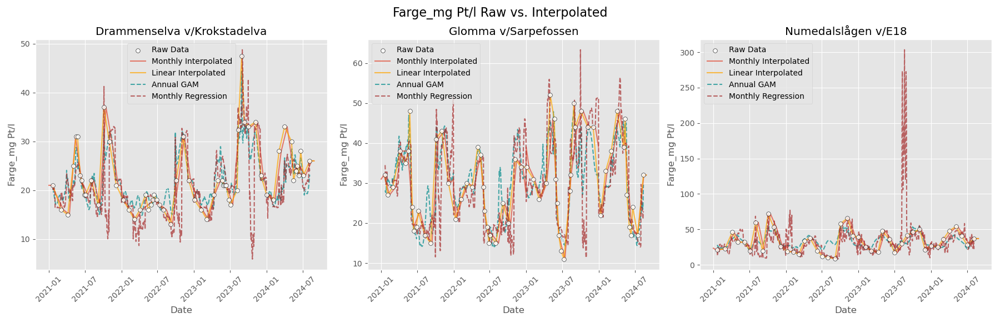

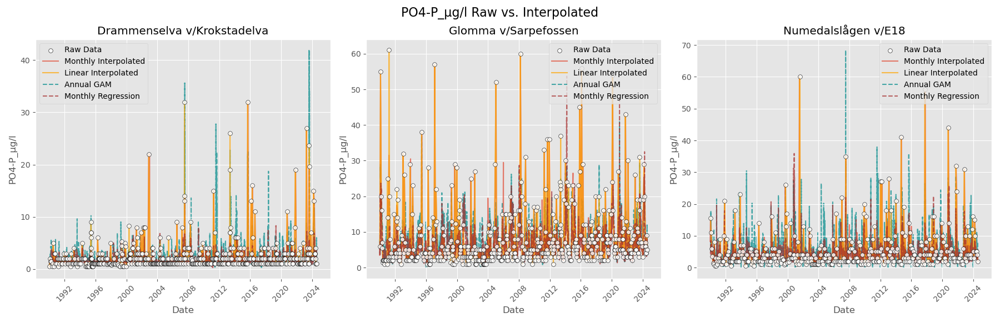

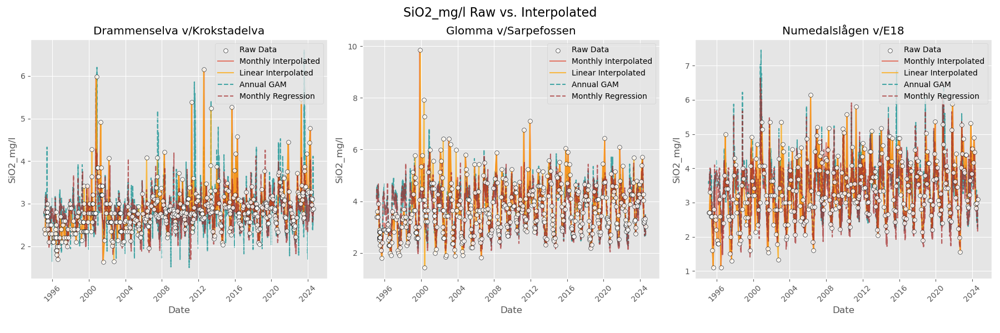

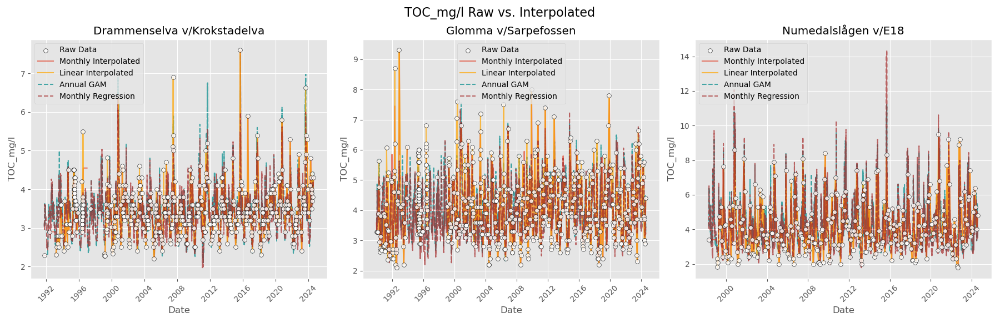

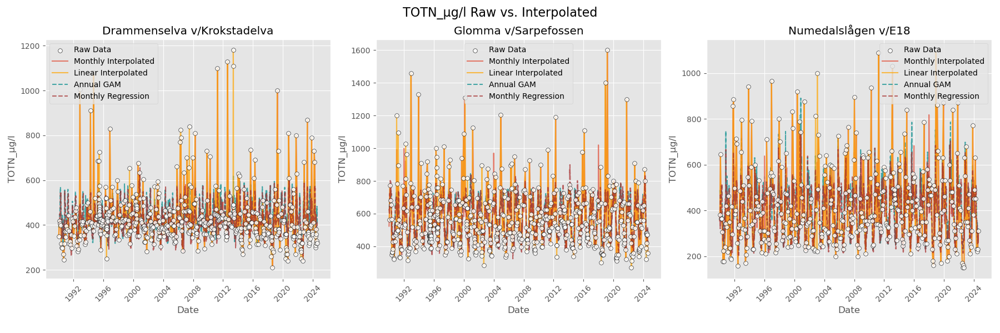

...

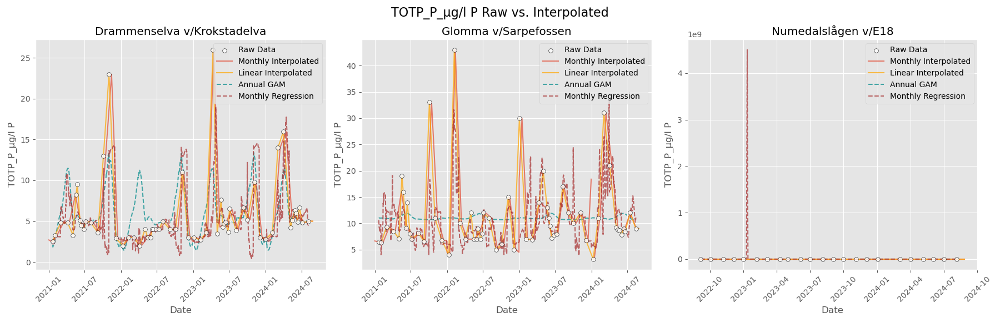

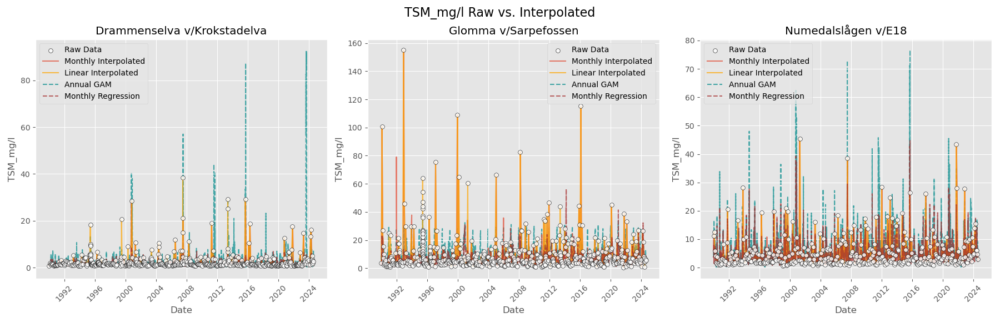

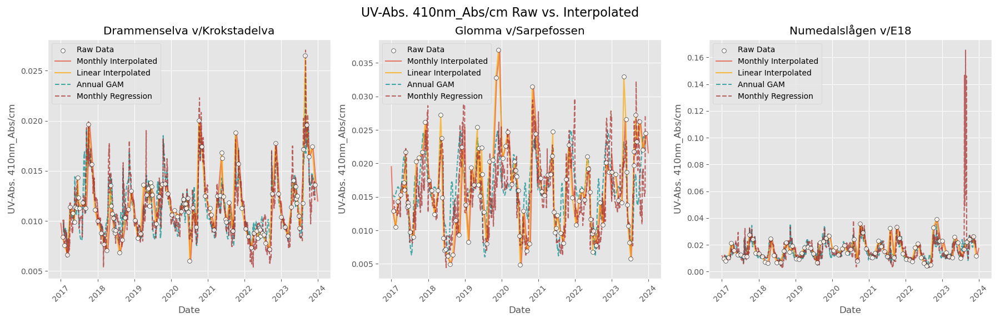

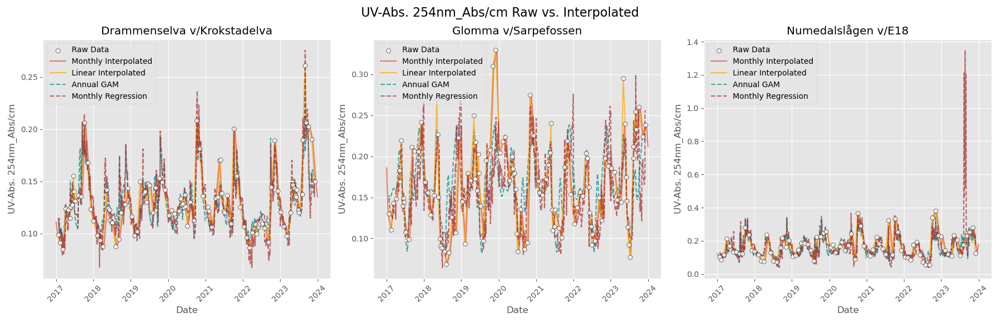

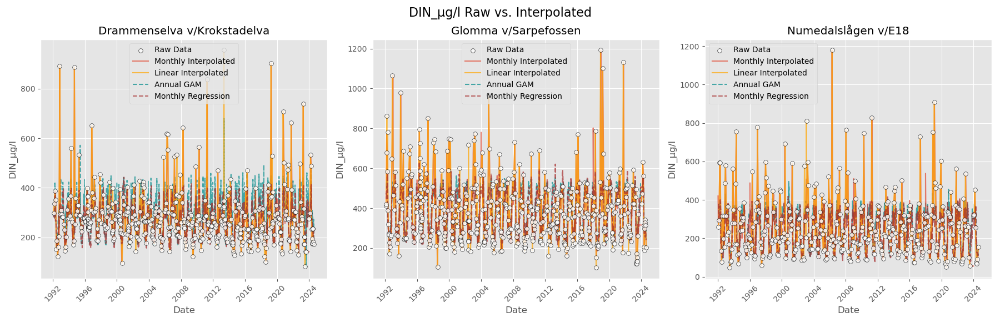

In [79]:
# Ensure that date_variable is in datetime format and is a column
if date_variable not in df_daily_all.columns:
    df_daily_all = df_daily_all.reset_index()
df_daily_all[date_variable] = pd.to_datetime(df_daily_all[date_variable])

stations = df_daily_all[station_name].unique()

for var in variables:

    fig, axes = plt.subplots(nrows=1, ncols=len(stations), figsize=(6 * len(stations), 6))
    if len(stations) == 1:
        axes = [axes]

    for ax, station in zip(axes, stations):
       
        df_station = df_daily_all[df_daily_all[station_name] == station]
        
        # Plot raw data
        ax.scatter(df_station[date_variable], df_station[var],
                   label='Raw Data', marker='o', facecolors='white', edgecolors='black',
                   s=30, alpha=0.8, zorder=4)
        
        # Plot monthly interpolated data 
        monthly_col = f"{var}_monthly_interp"
        if monthly_col in df_station.columns:
            ax.plot(df_station[date_variable], df_station[monthly_col],
                    label='Monthly Interpolated', linestyle='-', alpha=0.7, zorder=1)
        
        # Plot linear interpolated data 
        linear_col = f"{var}_linear_interp"
        if linear_col in df_station.columns:
            ax.plot(df_station[date_variable], df_station[linear_col],
                    label='Linear Interpolated', linestyle='-', color='orange', alpha=0.7, zorder=2)
        
        # Plot annual GAM data
        annual_gam_col = f"{var}_annual_gam"
        if annual_gam_col in df_station.columns:
            ax.plot(df_station[date_variable], df_station[annual_gam_col],
                    label='Annual GAM', linestyle='--', color='darkcyan', alpha=0.7, zorder=0)

        # Plot monthly medians
        monthly_regres_col = f"{var}_monthly_regres"
        if monthly_regres_col in df_station.columns:
            ax.plot(df_station[date_variable], df_station[monthly_regres_col],
                    label='Monthly Regression', linestyle='--', color='brown', alpha=0.7, zorder=3)
        
        ax.set_title(station)
        ax.set_xlabel(date_variable)
        ax.set_ylabel(var)
        ax.tick_params(axis='x', rotation=45)
        ax.legend()
        ax.grid(True)
    
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.suptitle(f'{var} Raw vs. Interpolated', fontsize=16)
    plt.show()


In [86]:

variables_mapper = {
    'Farge_mg Pt/l_est':'Farge_mg Pt/l_annual_gam',
    'DIN_μg/l_est':'DIN_μg/l_linear_interp',
    'PO4-P_µg/l_est':'PO4-P_µg/l_linear_interp',
    'SiO2_mg/l_est':'SiO2_mg/l_linear_interp',
    'TOC_mg/l_est':'TOC_mg/l_annual_gam',
    'TOTN_µg/l_est':'TOTN_µg/l_linear_interp',
    'TOTP/F_µg/l P_est': 'TOTP/F_µg/l P_linear_interp',
    'TOTP_P_µg/l P_est': 'TOTP_P_µg/l P_linear_interp',
    'TOTP_µg/l_est': 'TOTP_µg/l_linear_interp',
    'TSM_mg/l_est': 'TSM_mg/l_linear_interp',
    'UV-Abs. 410nm_Abs/cm_est': 'UV-Abs. 410nm_Abs/cm_annual_gam',
    'UV-Abs. 254nm_Abs/cm_est': 'UV-Abs. 254nm_Abs/cm_annual_gam'
}

variables_mapper_fillna = {
    'DIN_μg/l_est': 'DIN_μg/l_monthly_regres',
    'SiO2_mg/l_est': 'SiO2_mg/l_monthly_interp',
    'TOTP_µg/l_est': 'TOTP_µg/l_monthly_regres',
    'TSM_mg/l_est': 'TSM_mg/l_monthly_regres',
    
}

variables_mapper_per_station = {
    'Farge_mg Pt/l_est': {'Numedalslågen v/E18': 'Farge_mg Pt/l_linear_interp'},
    'UV-Abs. 410nm_Abs/cm_est': {'Glomma v/Sarpefossen': 'UV-Abs. 410nm_Abs/cm_linear_interp'},
    'UV-Abs. 254nm_Abs/cm_est': {'Glomma v/Sarpefossen': 'UV-Abs. 254nm_Abs/cm_linear_interp'}
    
    
}

# Create a new dataframe to store the raw and processed columns
df_new = pd.DataFrame()
df_new[station_name] = df_daily_all[station_name]
df_new[date_variable] = df_daily_all[date_variable]

for variable in variables_mapper:
    df_new[variable] = df_daily_all[variables_mapper[variable]]

for variable in variables_mapper_fillna:
    df_new[variable] = df_new[variable].fillna(df_daily_all[variables_mapper_fillna[variable]])


for variable in variables_mapper_per_station:
    for station in variables_mapper_per_station[variable]:
        df_new.loc[df_daily_all[station_name] == station , variable] = df_daily_all[variables_mapper_per_station[variable][station]]
        

# df_new['Farge_mg Pt/l_raw'] = df_daily_all['Farge_mg Pt/l']
# df_new['Farge_mg Pt/l_est'] = np.where(
#     df_daily_all[station_name] == 'Numedalslågen v/E18',
#     df_daily_all['Farge_mg Pt/l_linear_interp'],  # use linear_interp for this specific station
#     df_daily_all['Farge_mg Pt/l_annual_gam']       # otherwise use annual gam
# )


# #DIN_μg/l: processed data with gap-filling from monthly regression
# df_new['DIN_μg/l_raw'] = df_daily_all['DIN_μg/l']
# df_new['DIN_μg/l_est'] = df_daily_all['DIN_μg/l_linear_interp'].fillna(df_daily_all['DIN_μg/l_monthly_regres'])

# df_new['PO4-P_µg/l_raw'] = df_daily_all['PO4-P_µg/l']
# df_new['PO4-P_µg/l_est'] = df_daily_all['PO4-P_µg/l_linear_interp']

# #SiO2_mg/l: processed data with gap-filling from monthly regression
# df_new['SiO2_mg/l_raw'] = df_daily_all['SiO2_mg/l']
# df_new['SiO2_mg/l_est'] = df_daily_all['SiO2_mg/l_linear_interp'].fillna(df_daily_all['SiO2_mg/l_monthly_interp'])

# df_new['TOC_mg/l_raw'] = df_daily_all['TOC_mg/l']
# df_new['TOC_mg/l_est'] = df_daily_all['TOC_mg/l_annual_gam']

# df_new['TOTN_µg/l_raw'] = df_daily_all['TOTN_µg/l']
# df_new['TOTN_µg/l_est'] = df_daily_all['TOTN_µg/l_linear_interp']

# df_new['TOTP/F_µg/l P_raw'] = df_daily_all['TOTP/F_µg/l P']
# df_new['TOTP/F_µg/l P_est'] = df_daily_all['TOTP/F_µg/l P_linear_interp']

# df_new['TOTP_P_µg/l P_raw'] = df_daily_all['TOTP_P_µg/l P']
# df_new['TOTP_P_µg/l P_est'] = df_daily_all['TOTP_P_µg/l P_linear_interp']

# #TOTP_µg/l: processed data with gap-filling from monthly regression
# df_new['TOTP_µg/l_raw'] = df_daily_all['TOTP_µg/l']
# df_new['TOTP_µg/l_est'] = df_daily_all['TOTP_µg/l_linear_interp'].fillna(df_daily_all['TOTP_µg/l_monthly_regres'])

# #TSM_mg/l: processed data with gap-filling from monthly regression
# df_new['TSM_mg/l_raw'] = df_daily_all['TSM_mg/l']
# df_new['TSM_mg/l_est'] = df_daily_all['TSM_mg/l_linear_interp'].fillna(df_daily_all['TSM_mg/l_monthly_regres'])

# df_new['UV-Abs. 410nm_Abs/cm_raw'] = df_daily_all['UV-Abs. 410nm_Abs/cm']
# df_new['UV-Abs. 410nm_Abs/cm_est'] = np.where(
#     df_daily_all[station_name] == 'Glomma v/Sarpefossen',
#     df_daily_all['UV-Abs. 410nm_Abs/cm_linear_interp'],  # use linear_interp for this specific station
#     df_daily_all['UV-Abs. 410nm_Abs/cm_annual_gam']       # otherwise use annual gam
# )

# df_new['UV-Abs. 254nm_Abs/cm_raw'] = df_daily_all['UV-Abs. 254nm_Abs/cm']
# df_new['UV-Abs. 254nm_Abs/cm_est'] = np.where(
#     df_daily_all[station_name] == 'Glomma v/Sarpefossen',
#     df_daily_all['UV-Abs. 254nm_Abs/cm_linear_interp'],  # use linear_interp for this specific station
#     df_daily_all['UV-Abs. 254nm_Abs/cm_annual_gam']       # otherwise use annual gam
# )

df_new

,station_name,Date,Farge_mg Pt/l_est,DIN_μg/l_est,PO4-P_µg/l_est,SiO2_mg/l_est,TOC_mg/l_est,TOTN_µg/l_est,TOTP/F_µg/l P_est,TOTP_P_µg/l P_est,TOTP_µg/l_est,TSM_mg/l_est,UV-Abs. 410nm_Abs/cm_est,UV-Abs. 254nm_Abs/cm_est
0,Drammenselva v/Krokstadelva,1990-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Drammenselva v/Krokstadelva,1990-01-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Drammenselva v/Krokstadelva,1990-01-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Drammenselva v/Krokstadelva,1990-01-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Drammenselva v/Krokstadelva,1990-01-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37969,Numedalslågen v/E18,2024-08-23,37.0,155.0,2.0,3.09,NaN,310.0,NaN,6.6,7.8,2.91,NaN,NaN
37970,Numedalslågen v/E18,2024-08-24,37.0,155.0,2.0,3.09,NaN,310.0,NaN,6.6,7.8,2.91,NaN,NaN
37971,Numedalslågen v/E18,2024-08-25,37.0,155.0,2.0,3.09,NaN,310.0,NaN,6.6,7.8,2.91,NaN,NaN
37972,Numedalslågen v/E18,2024-08-26,37.0,155.0,2.0,3.09,NaN,310.0,NaN,6.6,7.8,2.91,NaN,NaN


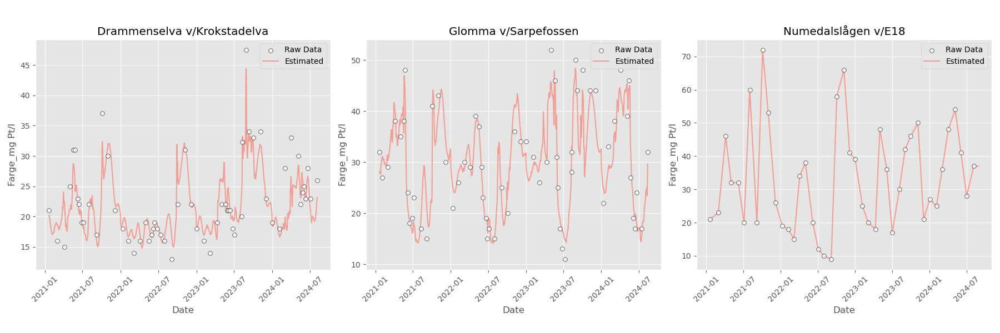

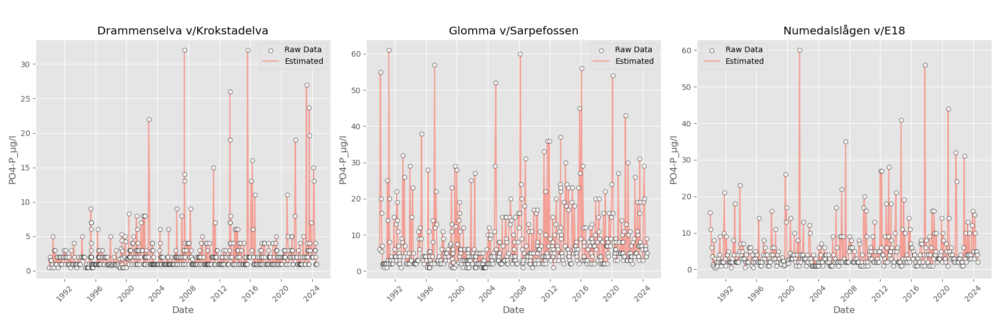

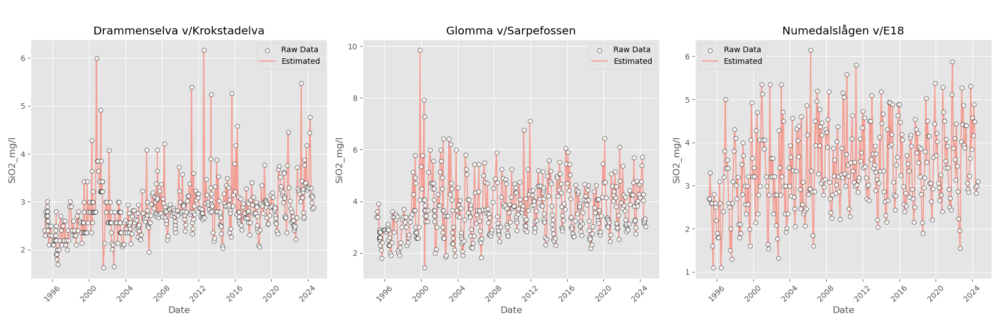

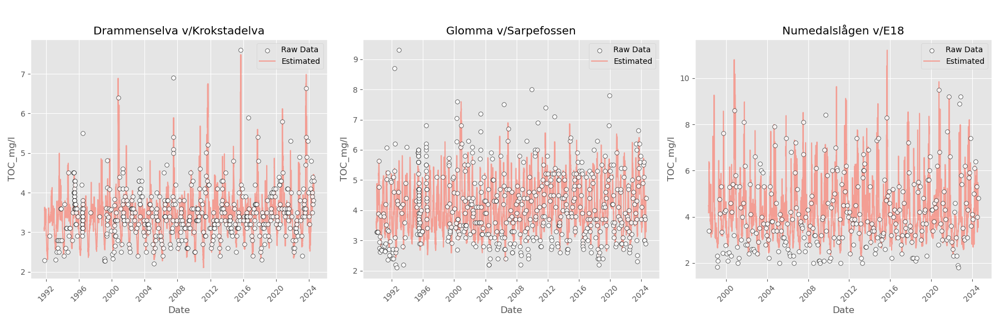

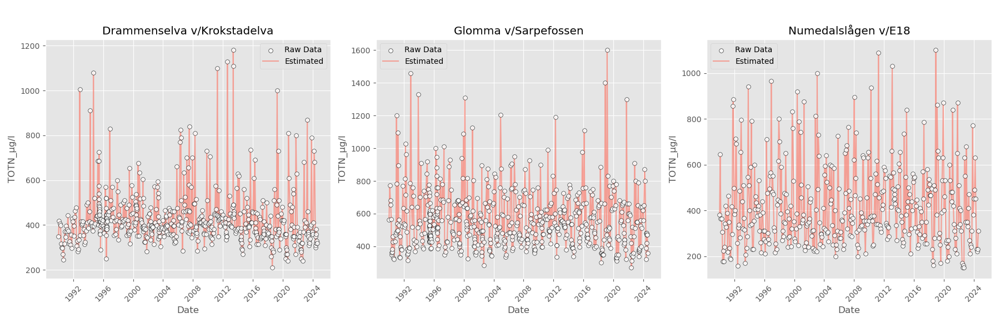

...

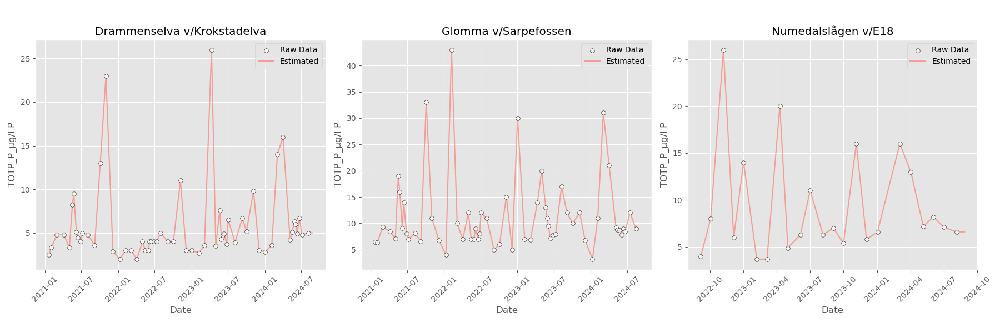

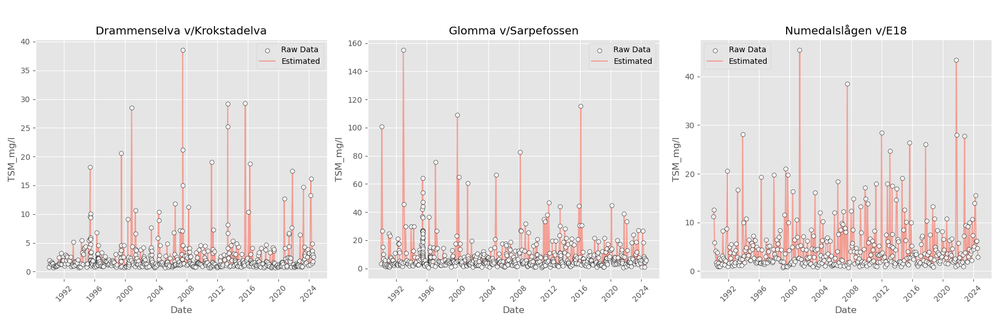

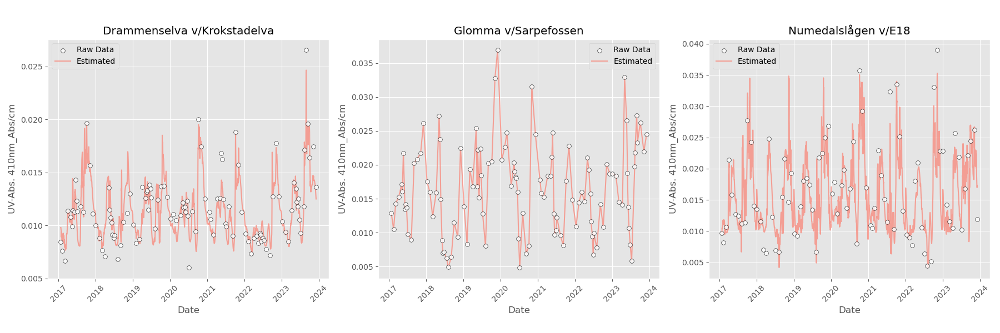

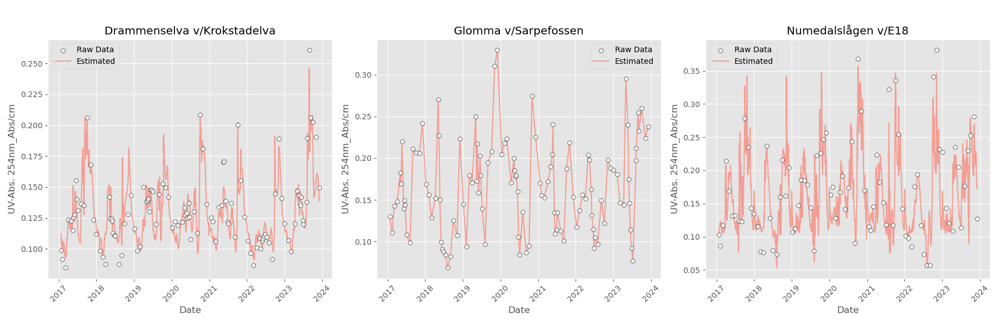

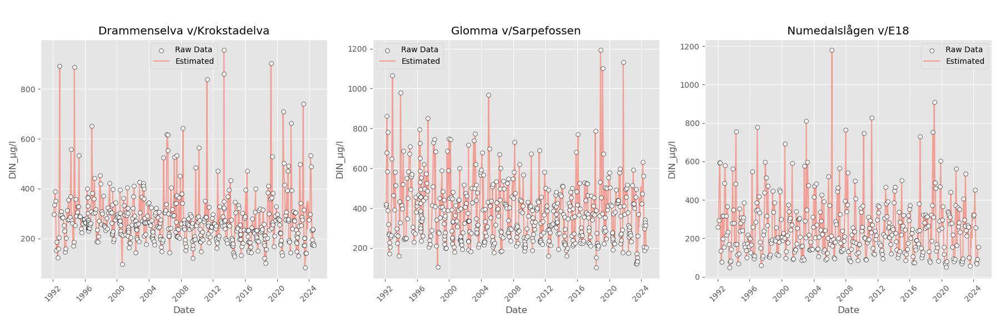

In [82]:
# Ensure that date_variable is in datetime format and is a column
if date_variable not in df_new.columns:
    df_new = df_new.reset_index()
df_new[date_variable] = pd.to_datetime(df_new[date_variable])

stations = df_new[station_name].unique()

for var in variables:
    raw_col = f"{var}_raw"
    proc_col = f"{var}_est"
        
    fig, axes = plt.subplots(nrows=1, ncols=len(stations), figsize=(6 * len(stations), 6))
    if len(stations) == 1:
        axes = [axes]
    
    for ax, station in zip(axes, stations):
        df_station = df_new[df_new[station_name] == station]
        
        # Plot raw data 
        ax.scatter(df_station[date_variable], df_station[raw_col],
                   label='Raw Data', marker='o', facecolors='white', edgecolors='black',
                   s=30, alpha=0.8, zorder=4)
        
        # Plot processed/estimated data
        if proc_col in df_station.columns:
            ax.plot(df_station[date_variable], df_station[proc_col],
                    label='Estimated', linestyle='-', color= 'salmon', alpha=0.7, zorder=2)
        
        ax.set_title(station)
        ax.set_xlabel(date_variable)
        ax.set_ylabel(var)
        ax.tick_params(axis='x', rotation=45)
        ax.legend()
        ax.grid(True)
    
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()


In [87]:
df_new.to_csv(output_path, index = False)